In [31]:
%matplotlib inline

import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

## Load polygons

In [ ]:
polygons = gpd.read_file('insitu-data/polygons.geojson')
polygons

## Load ground-truth

In [ ]:
labels = pd.read_csv('insitu-data/labels.csv')
labels

In [34]:
# change crsystem
parcels = polygons.merge(labels, on='id')
parcels = parcels.to_crs(epsg=3857)
polygons = polygons.to_crs(epsg=3857)
parcels

,id,geometry,s2_doy,doy,main_stage,main_stage_percent,secondary_stage,secondary_stage_percent,root_est,leaf_devel,squaring,flowering,boll_devel,boll_open,metalabel,sowing_date,harvest_date
0,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",123,123,1,90,0,NaN,2,0,0,0,0,0,1,12/4/2021,21-22/9/2021
1,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",130,131,2,100,0,NaN,0,2,0,0,0,0,4,12/4/2021,21-22/9/2021
2,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",140,140,2,100,0,NaN,0,2,0,0,0,0,4,12/4/2021,21-22/9/2021
3,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",148,148,2,100,0,NaN,0,2,0,0,0,0,4,12/4/2021,21-22/9/2021
4,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",153,153,2,100,0,NaN,0,2,0,0,0,0,4,12/4/2021,21-22/9/2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1518,96,"POLYGON ((2559745.493 4652618.120, 2559587.364...",220,221,4,100,5,80.0,0,0,0,2,1,0,11,29/4/2021,30/09/2021
1519,96,"POLYGON ((2559745.493 4652618.120, 2559587.364...",233,232,4,100,5,100.0,0,0,0,2,1,0,11,29/4/2021,30/09/2021
1520,96,"POLYGON ((2559745.493 4652618.120, 2559587.364...",253,254,5,100,6,50.0,0,0,0,0,2,1,14,29/4/2021,30/09/2021
1521,96,"POLYGON ((2559745.493 4652618.120, 2559587.364...",255,254,5,100,6,50.0,0,0,0,0,2,1,14,29/4/2021,30/09/2021


## Plot parcels

In [ ]:
ax = polygons.plot(figsize=(15, 15), alpha=0.5, color='yellow')
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery)

## Two random parcels
in the same DoY visit, with difference between main phenological stage

In [36]:
parcels[((parcels.id==1)|(parcels.id==73))&(parcels.doy==167)]

,id,geometry,s2_doy,doy,main_stage,main_stage_percent,secondary_stage,secondary_stage_percent,root_est,leaf_devel,squaring,flowering,boll_devel,boll_open,metalabel,sowing_date,harvest_date
7,1,"POLYGON ((2558543.243 4646714.618, 2558687.758...",168,167,3,90,2,10.0,0,1,2,0,0,0,6,12/4/2021,21-22/9/2021
1199,73,"POLYGON ((2560485.623 4644575.422, 2560358.340...",168,167,2,100,0,NaN,0,2,0,0,0,0,4,20/4/2021,24/9/2021


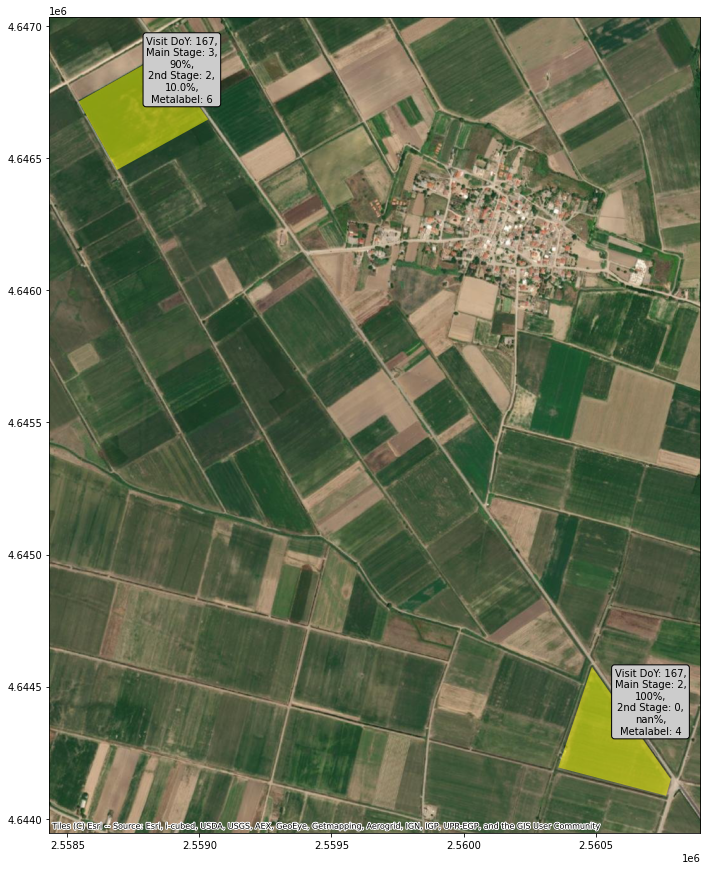

In [37]:
ax = polygons[(polygons.id==1)|(polygons.id==73)].plot(figsize=(15, 15), alpha=0.5, color='yellow')
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery)
for idx, row in parcels[((parcels.id==1)|(parcels.id==73))&(parcels.doy==167)].iterrows():
    plt.annotate(s='Visit DoY: '+str(row['doy'])+',\n'+'Main Stage: '+str(row['main_stage'])+',\n'
                 +str(row['main_stage_percent'])+'%'+',\n'+'2nd Stage: '+str(row['secondary_stage'])+',\n'
                 +str(row['secondary_stage_percent'])+'%'+',\n'+'Metalabel: '+str(row['metalabel']), 
                 xy=(row['geometry'].centroid.x,row['geometry'].centroid.y),
                 xytext=(40, 10), textcoords='offset points',
                 ha='center', color='black', bbox=dict(boxstyle="round", fc="0.8"))

In [38]:
from datetime import date
import os
year=2021
days=167
date=date.fromordinal(date(year, 1, 1).toordinal() + days - 1)
date=date.strftime('%Y%m%d')
relative_photos=[]

In [39]:
id_parcel='0001'
path = os.getcwd()+'/insitu-photos/demo_sample/'
for root, dirs, files in os.walk(path):
    for f in files:
        if ((id_parcel in f) and (date in f)):
#             print(os.path.join(root, f))
            relative_photos.append(os.path.join(root, f))

In [40]:
id_parcel='0073'
path = os.getcwd()+'/insitu-photos/demo_sample/'
for root, dirs, files in os.walk(path):
    for f in files:
        if ((id_parcel in f) and (date in f)):
#             print(os.path.join(root, f))
            relative_photos.append(os.path.join(root, f))

In [41]:
relative_photos

['/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0001-O.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0001-A1.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0001-B.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0001-A.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0073-Α1.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0073-Ο.jpg',
 '/home/itsoum/NOA_Beyond/eshape/cotton-phenology-dataset/insitu-photos/demo_sample/20210616_0073-Α.jpg']

## Photos from the field of aforementioned parcels
in the same DoY visit

20210616_0001-O.jpg


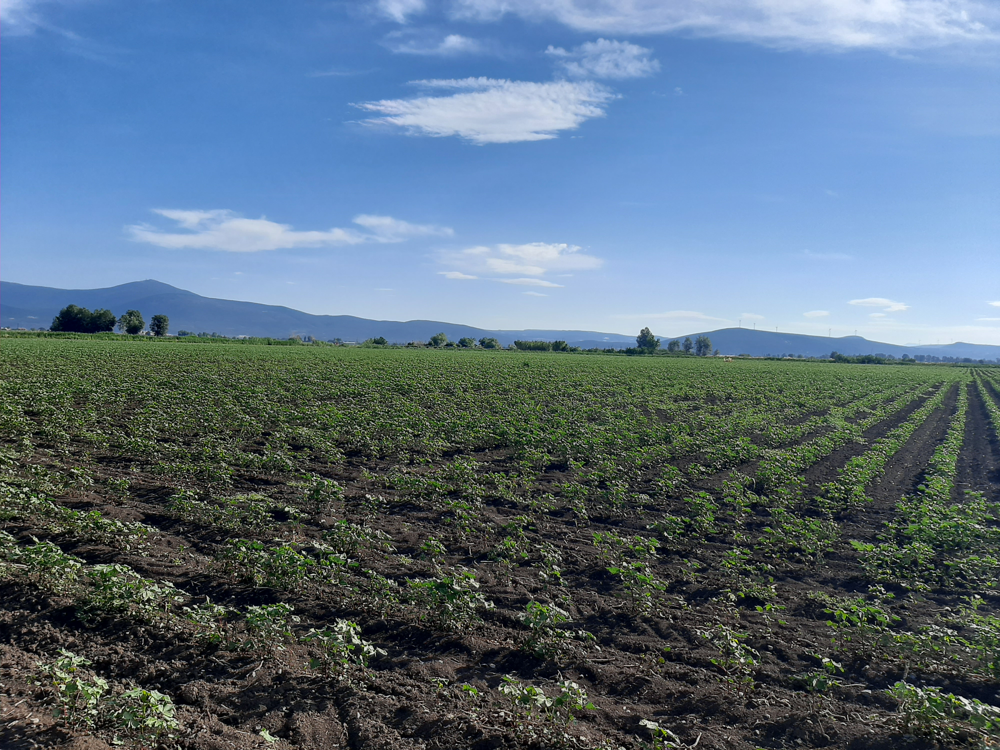

20210616_0001-A1.jpg


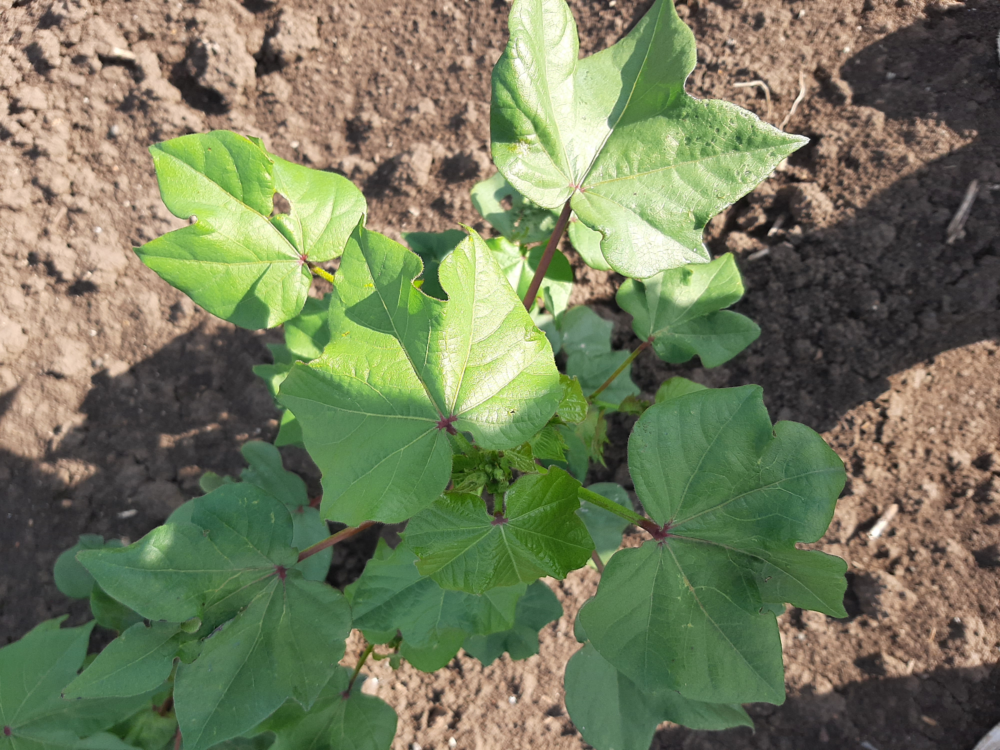

In [43]:
from IPython.display import Image, display

listOfImageNames = relative_photos[:2]

for imageName in listOfImageNames:
    print(imageName.split('/')[-1])
    display(Image(filename=imageName, width=300 ))